In [11]:
import numpy as np
import glob
import plotly.graph_objects as go

In [1]:
import os
if not os.path.exists('iopublic'):
    !git clone --depth 1 'https://github.com/llandsmeer/iopublic'

print(open('iopublic/README.md').read())

# iopublic

Stand alone version of the inferior olive model (without network generation & tuning)

Currently works with Arbor v0.6

## Example

```python
import iopublic
selected = '2021-12-08-shadow_averages_0.01_0.8_d1666304-c6fc-4346-a55d-a99b3aad55be'
iopublic.simulate_tuned_network(selected, tfinal=1, dt=0.025, gpu_id=0, spikes=())
```

##  Online version of 3-compartmental IO model

https://llandsmeer.github.io/IOJS/



In [13]:
def load_obj(fn):
    'auxilary function to read a wavefront obj file into numpy arrays'
    vertices = []
    vertex_normals = []
    faces = []
    with open(fn) as f:
        for line in f:
            if line.startswith('#'):
                continue
            parts = line.split()
            if not parts:
                continue
            elif parts[0] == 'v':
                vertices.append(tuple(map(float, parts[1:])))
            elif parts[0] == 'vn':
                vertex_normals.append(tuple(map(float, parts[1:])))
            elif parts[0] == 'f':
                faces.append(tuple(int(p.split('//')[0]) for p in parts[1:]))
            else:
                print(parts)
                assert False
    vertices = np.array(vertices)
    vertex_normals = np.array(vertex_normals)
    faces = np.array(faces)
    return vertices, vertex_normals, faces

In [14]:
!ls iopublic/mesh

DAO_left.obj   MAO_left.obj   PO_left.obj
DAO_right.obj  MAO_right.obj  PO_right.obj


In [22]:
def read_meshes():
    meshes = []
    for fn in glob.glob('iopublic/mesh/*.obj'):
        print(fn)
        name = fn.split('/')[-1].split('.')[0].replace('_', ' ')
        vv, vn, ff = load_obj(fn)
        x, y, z = vv.T
        i, j, k = ff.T - 1
        meshes.append(dict(
            name=name,
            x=x, y=y, z=z,
            i=i, j=j, k=k
        ))
    return meshes

meshes = read_meshes()

iopublic/mesh/PO_right.obj
iopublic/mesh/PO_left.obj
iopublic/mesh/DAO_left.obj
iopublic/mesh/DAO_right.obj
iopublic/mesh/MAO_left.obj
iopublic/mesh/MAO_right.obj


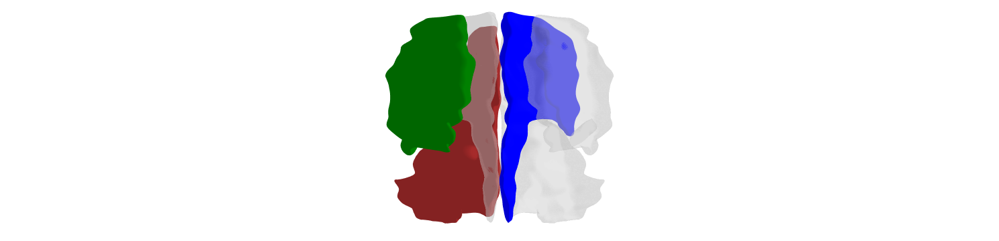

In [25]:
colormap = {'PO LEFT': 'blue', 'DAO RIGHT': 'green', 'MAO RIGHT': 'brown'}
go_meshes = []
for mesh in meshes:
    color = colormap.get(mesh['name'].upper(), '#cccccc')
    opacity = 1.0 if mesh['name'].upper() in colormap else 0.3
    go_meshes.append(go.Mesh3d(color=color, opacity=opacity, **mesh))
fig = go.Figure(data=go_meshes)

camera = dict(
    eye=dict(x=0, y=1.5, z=.1)
)

fig.update_layout(
    scene_camera=camera,
    scene=dict(
        xaxis=dict(showticklabels=False, visible=False),
        yaxis=dict(showticklabels=False, visible=False),
        zaxis=dict(showticklabels=False, visible=False),
    ),
    margin=dict(l=0,r=0,b=0,t=0)
)

In [10]:
meshes

[]